In [1]:
import os

os.chdir('/biodata/franco/zsuzsa_lab/jupyter')
from Bio import SeqIO
import numpy as np
import os
import argparse
import torch
from tqdm import tqdm
from transformers import T5Tokenizer, T5ForConditionalGeneration
import re

import mpl_stylesheet
mpl_stylesheet.banskt_presentation(fontfamily = 'mono', fontsize = 14, dpi=100)


def sequence_masker(seq, i, j, same_extra_token=False):
    masked_sequence_list = seq.split()
    token_num = 0
    if j<=i:
        print(f"index j={j} must be greater than i={i}")
        raise
    for x in range(i, j):
        if j > len(seq):
            break
        masked_sequence_list[x] = f"<extra_id_{token_num}>"
        if not same_extra_token:
            token_num += 1
    return " ".join(masked_sequence_list)

In [2]:

modelpath = "../models/prottrans_t5_xl_u50/"
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print(device)
fullmodel = T5ForConditionalGeneration.from_pretrained(modelpath).to(device)

# Load the tokenizer
tokenizer = T5Tokenizer.from_pretrained(modelpath, do_lower_case=False, legacy=False)
torch.cuda.empty_cache()


cuda:0


In [6]:
aa_vocabulary = "ACDEFGHIKLMNPQRSTVWY"
aa_vocab_list = list(aa_vocabulary)
AA2num = dict(zip(sorted(list(set([i for i in aa_vocabulary]))),np.arange(20)))
AA2num['</s>'] = 20
AA2num['X'] = 21
num2AA = dict(zip(np.arange(20),sorted(list(set([i for i in aa_vocabulary])))))
num2AA[20] = "</s>"
num2AA[21] = "X"
print(len(aa_vocab_list))


20


In [3]:
import collections
import json 

disprot_dict = collections.defaultdict(dict)

with open("/biodata/franco/datasets/disprot/disprot_OK_fullset_2023_12.fasta") as instrm:
    for record in SeqIO.parse(instrm, "fasta"):
            disprot_dict[record.id]['seq'] = str(record.seq)
with open("/biodata/franco/datasets/disprot/disprot_OK_fullset_annotations_2023_12.fasta") as instrm:
    for record in SeqIO.parse(instrm, "fasta"):
            disprot_dict[record.id]['disorder'] = str(record.seq)

In [4]:

disprot_matches_data = dict()
missing_count = 0
missing_files = []
for disprot_id in disprot_dict:
    seq = disprot_dict[disprot_id]['seq']
    if (len(seq) >= 600) and (len(seq) < 800):
        match_file = f"/biodata/franco/zsuzsa_lab/loss_T5_disprot/matches/{disprot_id}_matches.json"
        if os.path.exists(match_file):
            with open(match_file) as f:
                disprot_matches_data[disprot_id] = json.load(f)
        else:
            missing_files.append((disprot_id, match_file))
            missing_count += 1
print(f"Missing {missing_count} files")
print(f"Loaded {len(disprot_matches_data.keys())} files")

Missing 74 files
Loaded 249 files


In [137]:
wrong_aa = list()
not_valid_aa = list()

target_seqids = ["P21580", "F1QGH7"]

disprot_id = target_seqids[0]

def get_mismatch_matrix(disprot_id, disprot_matches_data, seq, disorder):
    mismatch_count_matrix = np.zeros((len(seq),len(seq)))
    matches = disprot_matches_data[disprot_id]

    diso_ix = [True if e != "-" else False for e in disorder ]

    barplot_pos = np.arange(len(seq))
    barplot_height = np.zeros(len(seq))

    assert len(matches) == len(seq)
    for current_pos, match in enumerate(matches):

        mismatch_count_matrix[current_pos, current_pos] = 1
        #check if match is bool or list
        if type(match) == bool:
            ## this entire sequence was predicted accurately
            pass
        else:
            for m in match:
                mismatch_pos, aa_predicted, aa_orig = m
                if (aa_orig not in aa_vocab_list) or (seq[mismatch_pos] not in aa_vocab_list):
                    not_valid_aa.append((disprot_id, mismatch_pos, aa_orig, seq[mismatch_pos]))
                    continue
                
                if aa_orig != seq[mismatch_pos]:
                    wrong_aa.append((disprot_id, mismatch_pos, aa_orig, seq[mismatch_pos]))
                    continue
                
                barplot_height[mismatch_pos] += 1
                relative_pos = mismatch_pos - current_pos

                if np.abs(relative_pos) > 3:
                    mismatch_count_matrix[current_pos, mismatch_pos] += 1
    return mismatch_count_matrix, barplot_pos, barplot_height

mismatch_count_matrix, barplot_pos, barplot_height = get_mismatch_matrix(disprot_id, disprot_matches_data, seq=disprot_dict[disprot_id]['seq'], disorder=disprot_dict[disprot_id]['disorder'])

In [138]:
import plotly.express as px
fig = px.imshow(mismatch_count_matrix, width=600, height=600, labels=dict(x="mismatch position", y="masked position", color="Count"))
fig.show()

In [139]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import ListedColormap

def draw_mismatch_matrix(mismatch_count_matrix, diso_ix, title):
    disorder_cmap_list = ['gray', 'crimson'] #, 'gold', 'lawngreen', 'blue', 'grey']
    disorder_cmap = ListedColormap(disorder_cmap_list)

    fig = plt.figure(figsize=(12,10))
    ax  = fig.add_subplot(111)
    im  = ax.imshow(mismatch_count_matrix, cmap='binary', aspect='auto')
    fig.colorbar(im, ax=ax, shrink=0.6)
    # fig.suptitle(f"{uniprots[unip]} {K}-mer embedding cos-distance")

    # Add annotations
    divider = make_axes_locatable(ax)

    # add disorder annotations
    #disorder_colors = np.zeros(len(seq))
    disorder_colors = [1 if e else 0 for e in diso_ix]
    disorder_regioncolors = np.zeros((len(seq), int(mismatch_count_matrix.shape[0]*0.03) ))
    for i,x in enumerate(disorder_colors):
        disorder_regioncolors[i, :] = x
        
    cax_disordercolors = divider.append_axes("top", size="3%", pad= 0.1)
    cax_disordercolors.set_axis_off()
    disccol = cax_disordercolors.imshow(disorder_regioncolors.T, cmap=disorder_cmap)

    # cax_barplot = divider.append_axes("top", size="10%", pad=0.1)
    # cax_barplot.set_axis_off()
    # bp = cax_barplot.bar(barplot_pos, barplot_height)

    cax_disordercolors2 = divider.append_axes("right", size="3%", pad= 0.1)
    cax_disordercolors2.set_axis_off()
    disccol = cax_disordercolors2.imshow(disorder_regioncolors, cmap=disorder_cmap)


    bbox_points = plt.gcf().transFigure.inverted().transform(cax_disordercolors.get_tightbbox(fig.canvas.get_renderer()).get_points())
    label_xpoint = bbox_points[1,0] + 0.01*bbox_points[1,0]
    label_ypoint = bbox_points[0,1] #+ (bbox_points[1,1]-bbox_points[1,0])
    ax.text(label_xpoint, label_ypoint, "Disorder", va='bottom', ha='left', transform=plt.gcf().transFigure)

    ax.set_xlabel("mismatch position")
    ax.set_ylabel("masked position")
    fig.suptitle(title)
    plt.savefig(f"plots/{title}_mismatch_matrix_T5.png", bbox_inches='tight')
    plt.show()

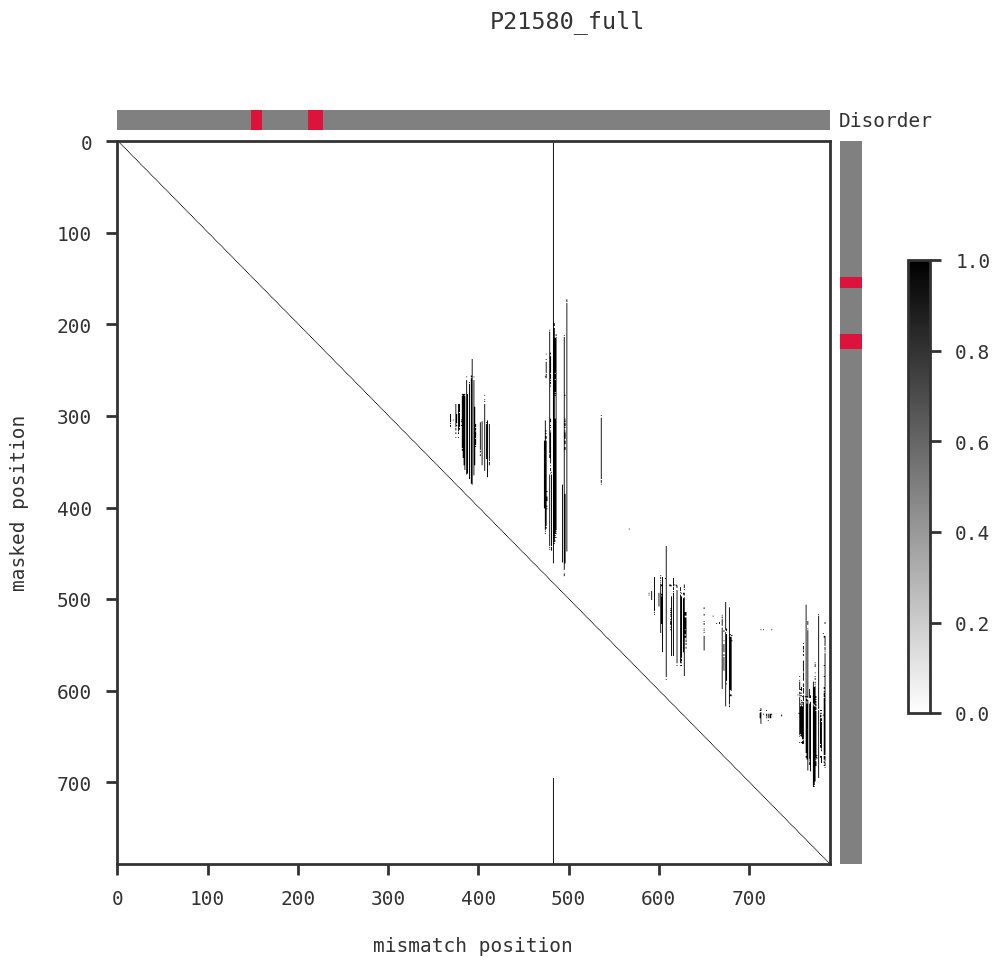

In [140]:
draw_mismatch_matrix(mismatch_count_matrix, diso_ix, f"{disprot_id}_full")

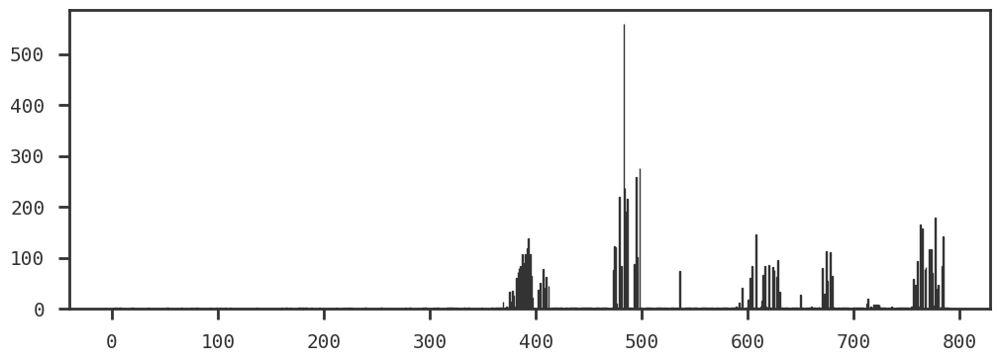

In [141]:
fig = plt.figure(figsize=(12, 4))
ax  = fig.add_subplot(111)
ax.bar(barplot_pos, barplot_height)
plt.show()

In [142]:
aa_sequence = disprot_dict[disprot_id]['seq']
print(aa_sequence)
uniprot_id = disprot_id
print(disprot_id, len(aa_sequence))

MAEQVLPQALYLSNMRKAVKIRERTPEDIFKPTNGIIHHFKTMHRYTLEMFRTCQFCPQFREIIHKALIDRNIQATLESQKKLNWCREVRKLVALKTNGDGNCLMHATSQYMWGVQDTDLVLRKALFSTLKETDTRNFKFRWQLESLKSQEFVETGLCYDTRNWNDEWDNLIKMASTDTPMARSGLQYNSLEEIHIFVLCNILRRPIIVISDKMLRSLESGSNFAPLKVGGIYLPLHWPAQECYRYPIVLGYDSHHFVPLVTLKDSGPEIRAVPLVNRDRGRFEDLKVHFLTDPENEMKEKLLKEYLMVIEIPVQGWDHGTTHLINAAKLDEANLPKEINLVDDYFELVQHEYKKWQENSEQGRREGHAQNPMEPSVPQLSLMDVKCETPNCPFFMSVNTQPLCHECSERRQKNQNKLPKLNSKPGPEGLPGMALGASRGEAYEPLAWNPEESTGGPHSAPPTAPSPFLFSETTAMKCRSPGCPFTLNVQHNGFCERCHNARQLHASHAPDHTRHLDPGKCQACLQDVTRTFNGICSTCFKRTTAEASSSLSTSLPPSCHQRSKSDPSRLVRSPSPHSCHRAGNDAPAGCLSQAARTPGDRTGTSKCRKAGCVYFGTPENKGFCTLCFIEYRENKHFAAASGKVSPTASRFQNTIPCLGRECGTLGSTMFEGYCQKCFIEAQNQRFHEAKRTEEQLRSSQRRDVPRTTQSTSRPKCARASCKNILACRSEELCMECQHPNQRMGPGAHRGEPAPEDPPKQRCRAPACDHFGNAKCNGYCNECFQFKQMYG
P21580 790


In [147]:

output_attentions = False
autoregressive = False
savelogits = False

pred_dict = dict()
mask_sizes = [1]
mask_size = 1

start_offsets = [100, 200, 300, 400]
pred_dict[disprot_id] = dict()
for start_offset in start_offsets:
    target_seq = aa_sequence[start_offset:]
    input_seq = [" ".join(list(re.sub(r"[UZOB]", "X", target_seq)))]
    true_input = tokenizer(input_seq)
    true_tok = torch.tensor(true_input['input_ids']).to(device)
    attention_mask = torch.tensor(true_input['attention_mask']).to(device)
            
    loss_sequence = list()
    match_sequence = list()
    #logits_sequence = list()
    for i in tqdm(range(len(target_seq)-mask_size+1)):
        masked_seq = [sequence_masker(input_seq[0], i, i+mask_size)]
        tmp = tokenizer(masked_seq)
        input_ids = torch.tensor(tmp['input_ids']).to(device)
        
        if autoregressive:
            with torch.no_grad():
                emb = fullmodel.generate(input_ids, max_length=len(input_ids[0])+1, return_dict_in_generate=True, output_scores=True, output_attentions=output_attentions)
            cpulogits = torch.stack([s.squeeze() for s in emb.scores], dim=0)[:-1,]
            fastpred = tokenizer.decode(torch.argmax(cpulogits, dim=1), skip_special_tokens=False).replace("<"," <").replace(">","> ")
            
            # Calculate protein-level loss from single aminoacid losses
            acum = 0
            for j in range(cpulogits.shape[0]):
                acum += celoss(cpulogits[j], true_tok.squeeze()[:-1][j])        
            protein_loss  = acum/cpulogits.shape[0]
            # the proper full protein loss should be the one below, but it will fail if dimentions are not correct
            # the above expression will be wrong, but aproximate? maybe shifted by one? it will suck, let's set it to -1
            ## protein_loss2 = celoss(cpulogits, true_tok.squeeze()[:-1]) 
        else:
            with torch.no_grad():
                emb = fullmodel(input_ids=input_ids, labels=true_tok, output_attentions=output_attentions)
            protein_loss = emb.loss.cpu()
            
            cpulogits = emb.logits.cpu().squeeze()[:-1]
            ## fastpred = tokenizer.decode(torch.tensor(cpulogits[:,:-1,:].numpy().argmax(-1)[0]), skip_special_tokens=False).replace("<"," <").replace(">","> ")
            fastpred = tokenizer.decode(torch.argmax(cpulogits, dim=1), skip_special_tokens=False).replace("<"," <").replace(">","> ")
            
        #logits_sequence.append(cpulogits.numpy().tolist())
        if input_seq[0] == fastpred:
            match_sequence.append(True)
            loss_sequence.append(protein_loss.item())
        else:
            pred_arr = fastpred.split()
            seq_arr  = input_seq[0].split()
            if len(pred_arr) == len(seq_arr):
                local_match_sequence = list()
                for j in range(len(pred_arr)):
                    if pred_arr[j] != seq_arr[j]:
                        local_match_sequence.append((j,pred_arr[j], seq_arr[j]))
                loss_sequence.append(protein_loss.item())
                match_sequence.append(local_match_sequence)
            else:
                print(f"{i} - Mismatch length error")
                match_sequence.append(False)
                loss_sequence.append(-1)            
    
    pred_dict[disprot_id][start_offset] = dict()
    pred_dict[disprot_id][start_offset]["match"] = match_sequence
    pred_dict[disprot_id][start_offset]["loss"] = loss_sequence
    #np.save(f"{outdir}/logits/{disprot_id}_logits_sequence.npy",  np.array(logits_sequence, dtype=object), allow_pickle=True)

  0%|          | 1/690 [00:00<03:28,  3.30it/s]

100%|██████████| 390/390 [01:10<00:00,  5.56it/s]


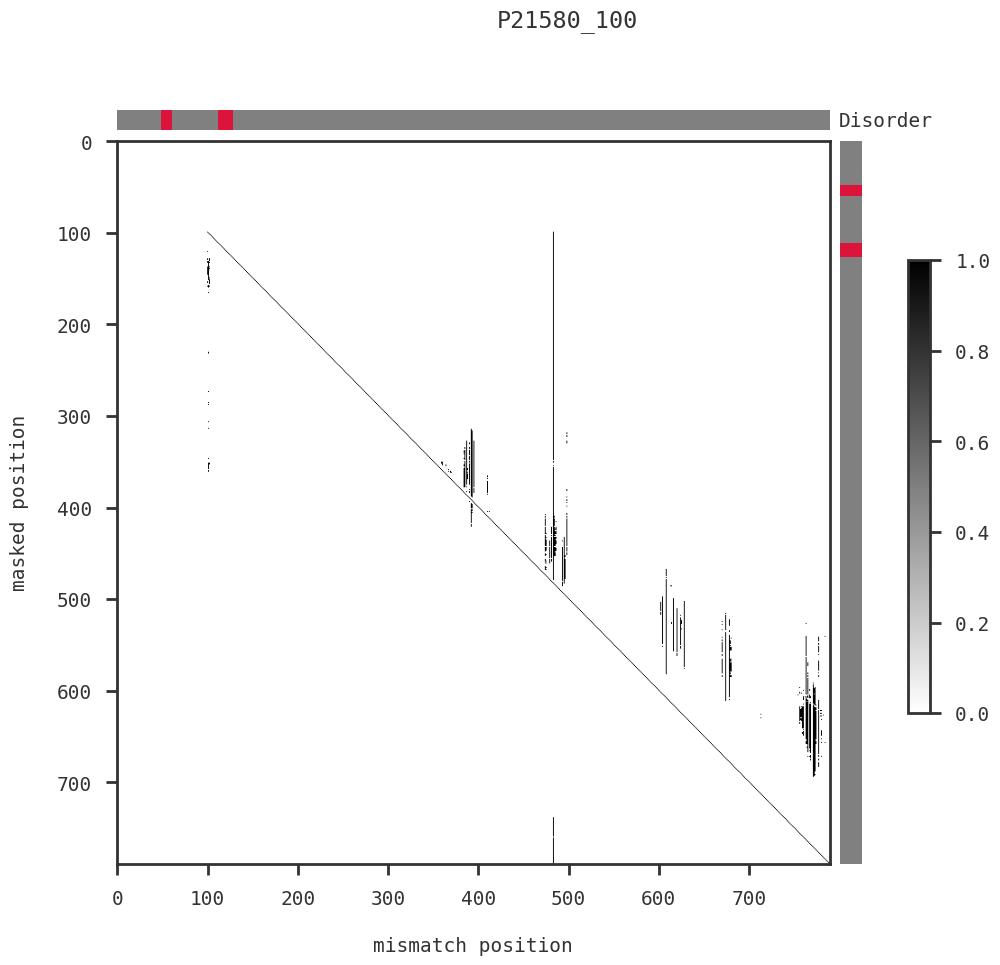

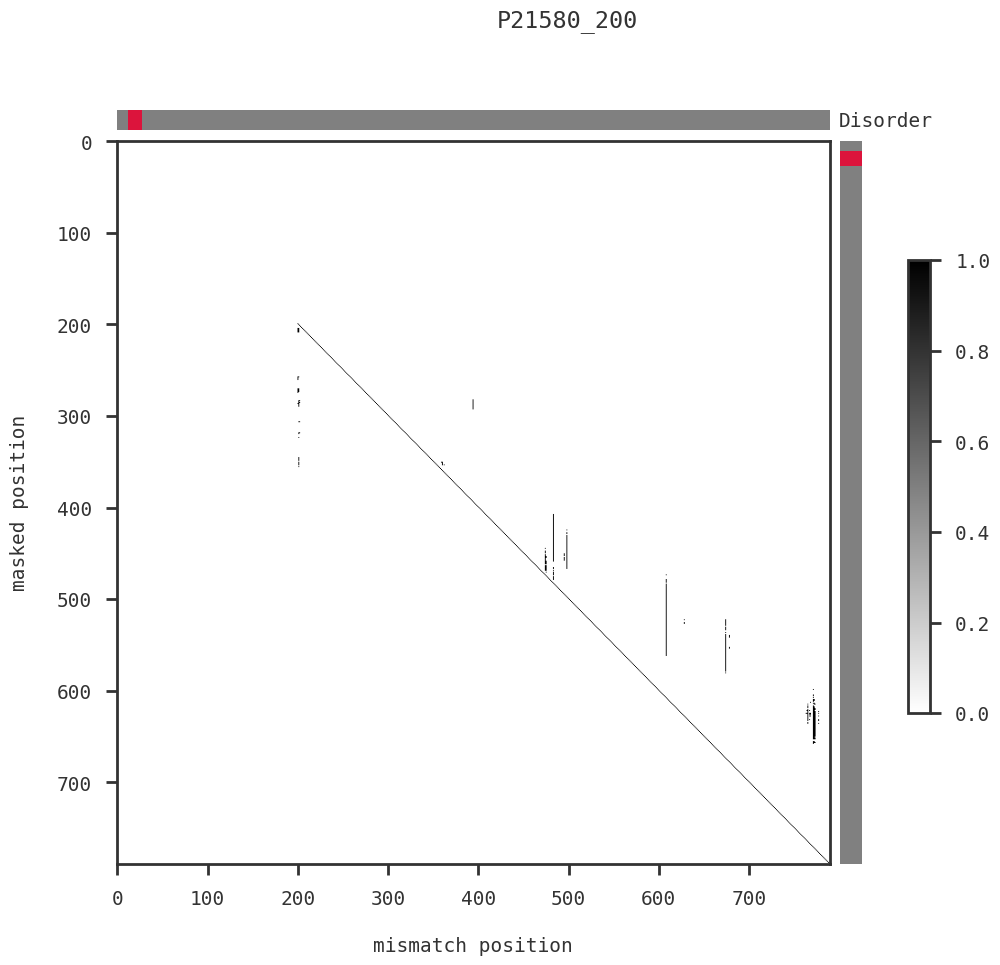

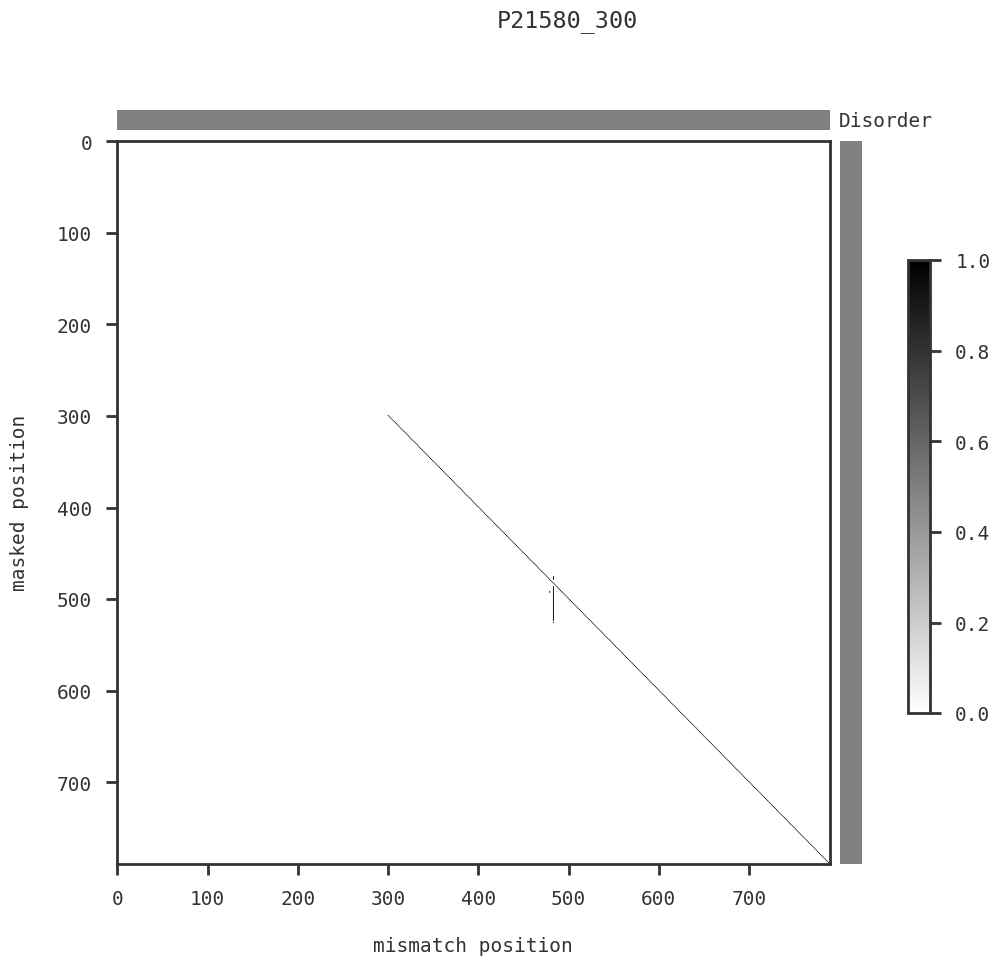

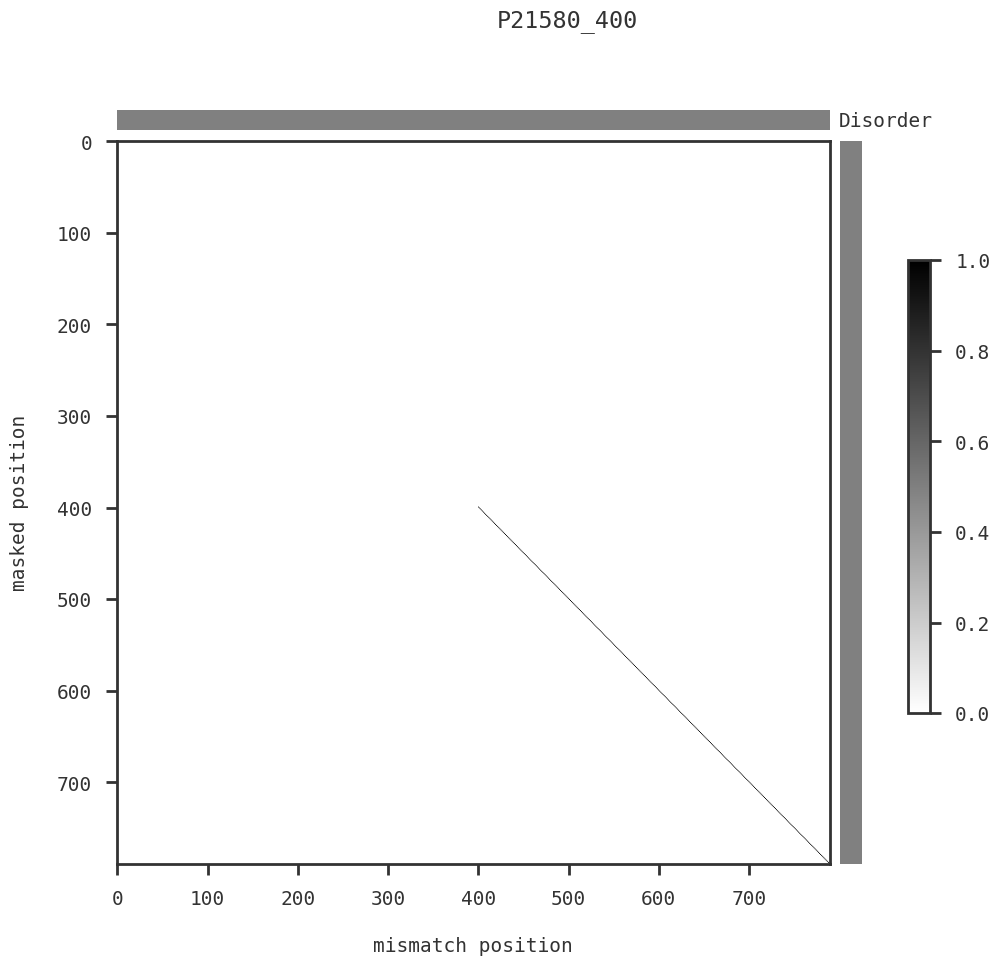

In [148]:

seqlen = len(aa_sequence)
for start_offset in start_offsets:
    new_matches_data = dict()
    new_matches_data[disprot_id] = pred_dict[disprot_id][start_offset]['match']
    diso_ix = [True if e != "-" else False for e in disprot_dict[disprot_id]['disorder']]
    mismatch_count_matrix, barplot_pos, barplot_height = get_mismatch_matrix(disprot_id, new_matches_data, seq=disprot_dict[disprot_id]['seq'][start_offset:], disorder=disprot_dict[disprot_id]['disorder'][start_offset:])
    new_matrix = np.zeros((seqlen, seqlen))
    for i in range(seqlen-start_offset):
        for j in range(seqlen-start_offset):
            new_matrix[i+start_offset,j+start_offset] = mismatch_count_matrix[i][j]
    draw_mismatch_matrix(new_matrix, diso_ix[start_offset:], f"{disprot_id}_{start_offset}")

In [146]:
pred_dict['P21580'].keys()

dict_keys([400])

In [118]:
len(disprot_dict[disprot_id]['seq'][start_offset:])
len(new_matches_data[disprot_id])

590